In [1]:
from google.colab import files
import io
import pandas as pd

uploaded = files.upload()

for filename in uploaded.keys():
    print("Uploaded file name:", filename)

    df = pd.read_excel(io.BytesIO(uploaded[filename]))

df.head()

Saving Road Accident Data.xlsx to Road Accident Data.xlsx
Uploaded file name: Road Accident Data.xlsx


,Accident_Index,Accident Date,Month,Day_of_Week,Year,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,...,Number_of_Casualties,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200901BS70001,2021-01-01 00:00:00,Jan,Thursday,2021,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,...,1,2,Metropolitan Police,Dry,One way street,30,15:11:00,Urban,Fine no high winds,Car
1,200901BS70002,2021-05-01 00:00:00,Jan,Monday,2021,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,...,11,2,Metropolitan Police,Wet or damp,Single carriageway,30,10:59:00,Urban,Fine no high winds,Taxi/Private hire car
2,200901BS70003,2021-04-01 00:00:00,Jan,Sunday,2021,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,...,1,2,Metropolitan Police,Dry,Single carriageway,30,14:19:00,Urban,Fine no high winds,Taxi/Private hire car
3,200901BS70004,2021-05-01 00:00:00,Jan,Monday,2021,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,...,1,2,Metropolitan Police,Frost or ice,Single carriageway,30,08:10:00,Urban,Other,Motorcycle over 500cc
4,200901BS70005,2021-06-01 00:00:00,Jan,Tuesday,2021,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,...,1,2,Metropolitan Police,Dry,Single carriageway,30,17:25:00,Urban,Fine no high winds,Car


In [2]:
df.columns = df.columns.str.strip()

print("\n📋 Dataset Preview:")
display(df.head())
print("\n📊 Columns:", df.columns.tolist())
print("\n🧹 Missing Values:")
print(df.isnull().sum())


📋 Dataset Preview:


,Accident_Index,Accident Date,Month,Day_of_Week,Year,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,...,Number_of_Casualties,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200901BS70001,2021-01-01 00:00:00,Jan,Thursday,2021,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,...,1,2,Metropolitan Police,Dry,One way street,30,15:11:00,Urban,Fine no high winds,Car
1,200901BS70002,2021-05-01 00:00:00,Jan,Monday,2021,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,...,11,2,Metropolitan Police,Wet or damp,Single carriageway,30,10:59:00,Urban,Fine no high winds,Taxi/Private hire car
2,200901BS70003,2021-04-01 00:00:00,Jan,Sunday,2021,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,...,1,2,Metropolitan Police,Dry,Single carriageway,30,14:19:00,Urban,Fine no high winds,Taxi/Private hire car
3,200901BS70004,2021-05-01 00:00:00,Jan,Monday,2021,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,...,1,2,Metropolitan Police,Frost or ice,Single carriageway,30,08:10:00,Urban,Other,Motorcycle over 500cc
4,200901BS70005,2021-06-01 00:00:00,Jan,Tuesday,2021,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,...,1,2,Metropolitan Police,Dry,Single carriageway,30,17:25:00,Urban,Fine no high winds,Car



📊 Columns: ['Accident_Index', 'Accident Date', 'Month', 'Day_of_Week', 'Year', 'Junction_Control', 'Junction_Detail', 'Accident_Severity', 'Latitude', 'Light_Conditions', 'Local_Authority_(District)', 'Carriageway_Hazards', 'Longitude', 'Number_of_Casualties', 'Number_of_Vehicles', 'Police_Force', 'Road_Surface_Conditions', 'Road_Type', 'Speed_limit', 'Time', 'Urban_or_Rural_Area', 'Weather_Conditions', 'Vehicle_Type']

🧹 Missing Values:
Accident_Index                     0
Accident Date                      0
Month                              0
Day_of_Week                        0
Year                               0
Junction_Control                   0
Junction_Detail                    0
Accident_Severity                  0
Latitude                           0
Light_Conditions                   0
Local_Authority_(District)         0
Carriageway_Hazards           302549
Longitude                          0
Number_of_Casualties               0
Number_of_Vehicles                 0
Po

Parsed 'Hour' values (non-null): 307956


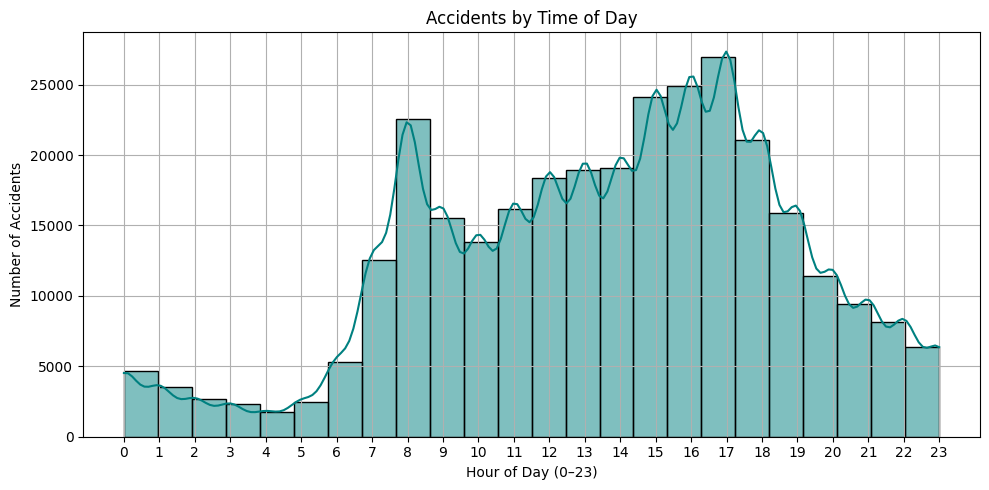

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

df['Hour'] = df['Time'].apply(lambda x: x.hour if pd.notnull(x) else None)

print(f"Parsed 'Hour' values (non-null): {df['Hour'].notnull().sum()}")

plt.figure(figsize=(10, 5))
sns.histplot(df['Hour'].dropna(), bins=24, kde=True, color='teal')
plt.title("Accidents by Time of Day")
plt.xlabel("Hour of Day (0–23)")
plt.ylabel("Number of Accidents")
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()

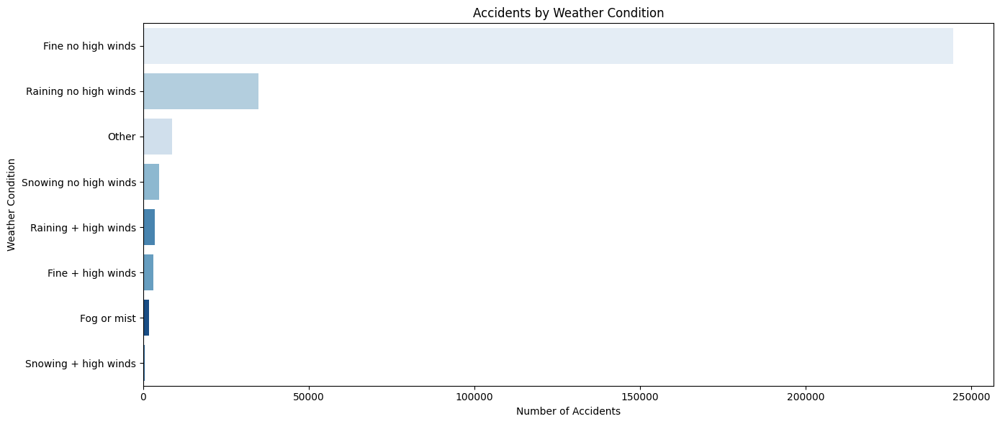

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

df.columns = df.columns.str.strip()

if 'Weather_Conditions' in df.columns:
    plt.figure(figsize=(14, 6))
    sns.countplot(
        data=df,
        y='Weather_Conditions',
        hue='Weather_Conditions',
        order=df['Weather_Conditions'].value_counts().index,
        palette='Blues'
    )
    plt.legend([],[], frameon=False)
    plt.title("Accidents by Weather Condition")
    plt.xlabel("Number of Accidents")
    plt.ylabel("Weather Condition")
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ 'Weather_Conditions' column not found.")

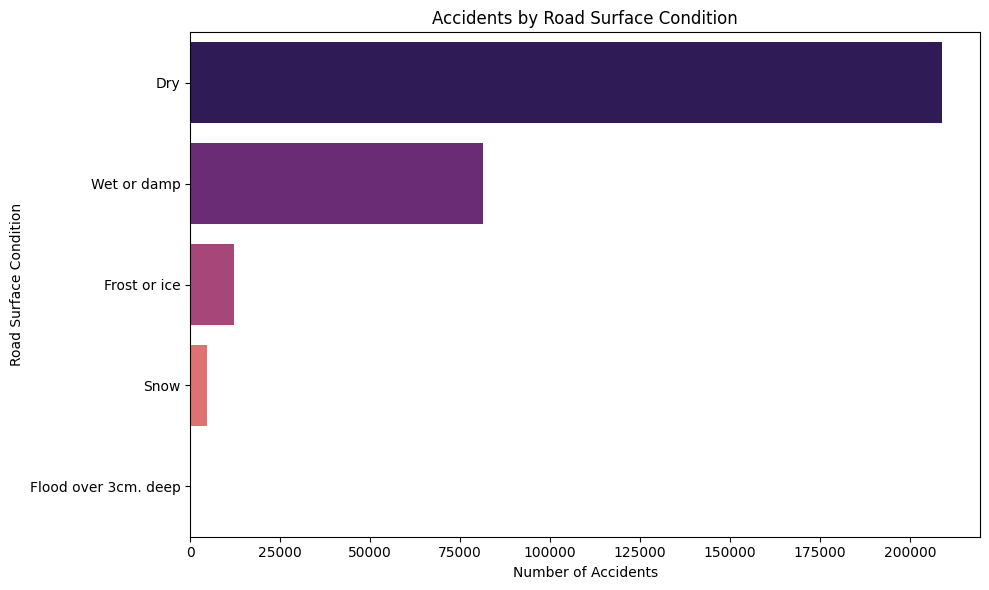

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

df.columns = df.columns.str.strip()

if 'Road_Surface_Conditions' in df.columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(
        data=df,
        y='Road_Surface_Conditions',
        hue='Road_Surface_Conditions',
        order=df['Road_Surface_Conditions'].value_counts().index,
        palette='magma'
    )
    plt.legend([],[], frameon=False)
    plt.title("Accidents by Road Surface Condition")
    plt.xlabel("Number of Accidents")
    plt.ylabel("Road Surface Condition")
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ 'Road_Surface_Conditions' column not found in the dataset.")

In [6]:
import plotly.express as px

map_df = df.dropna(subset=['Latitude', 'Longitude'])

fig = px.scatter_geo(
    map_df,
    lat='Latitude',
    lon='Longitude',
    scope='europe',
    title="Road Accident Locations in UK",
    opacity=0.5,
    color_discrete_sequence=['crimson']
)

fig.update_layout(height=600)
fig.show()

In [7]:
fig = px.scatter_geo(
    map_df,
    lat='Latitude',
    lon='Longitude',
    projection="natural earth",
    title="UK Road Accident Locations",
    opacity=0.5,
    color_discrete_sequence=['crimson']
)

fig.update_geos(
    center=dict(lat=54, lon=-2),
    resolution=50,
    scope='europe',
    lataxis_range=[49, 61],
    lonaxis_range=[-8, 2]
)

fig.update_layout(height=600)
fig.show()

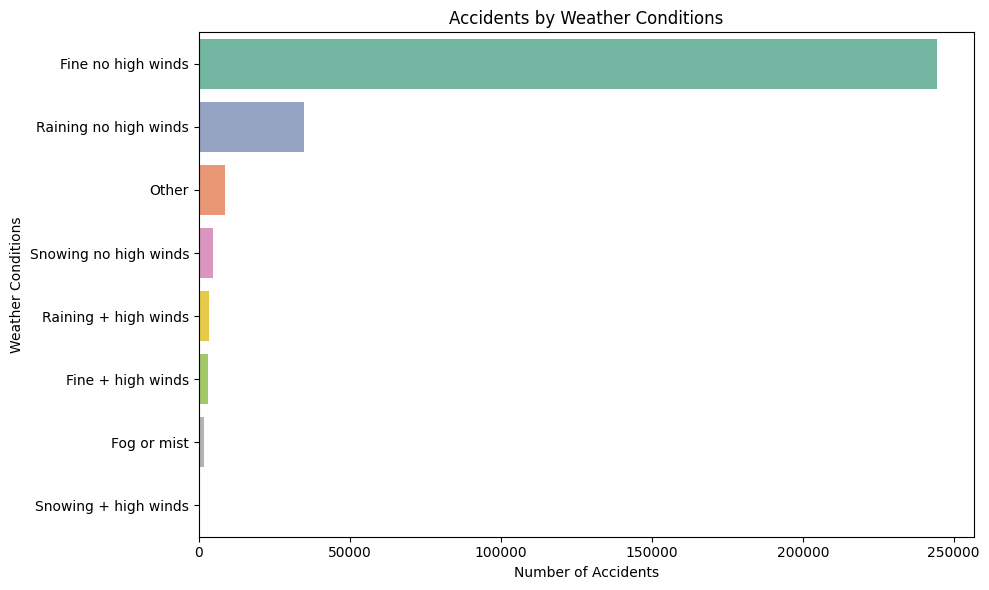

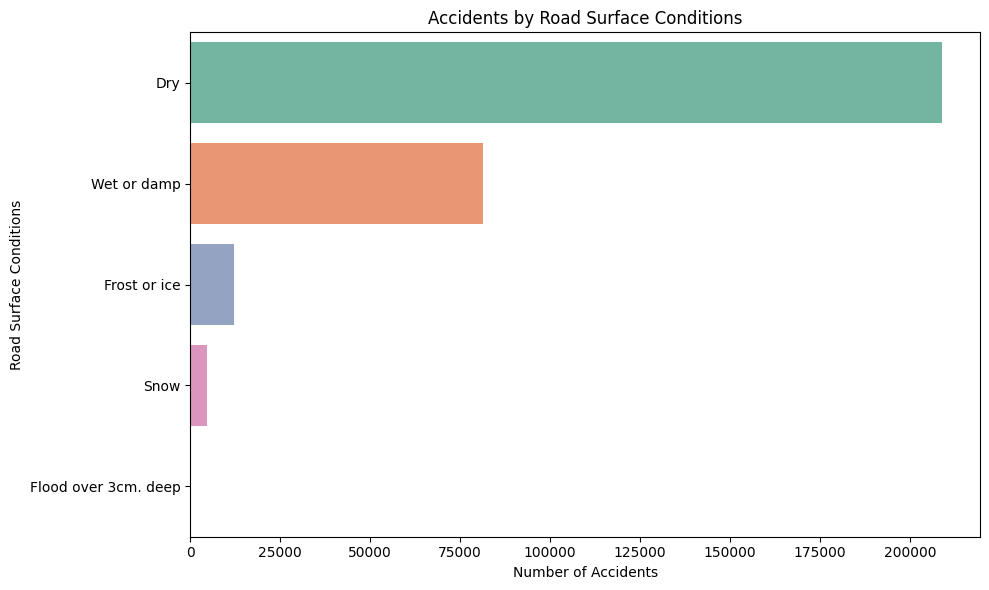

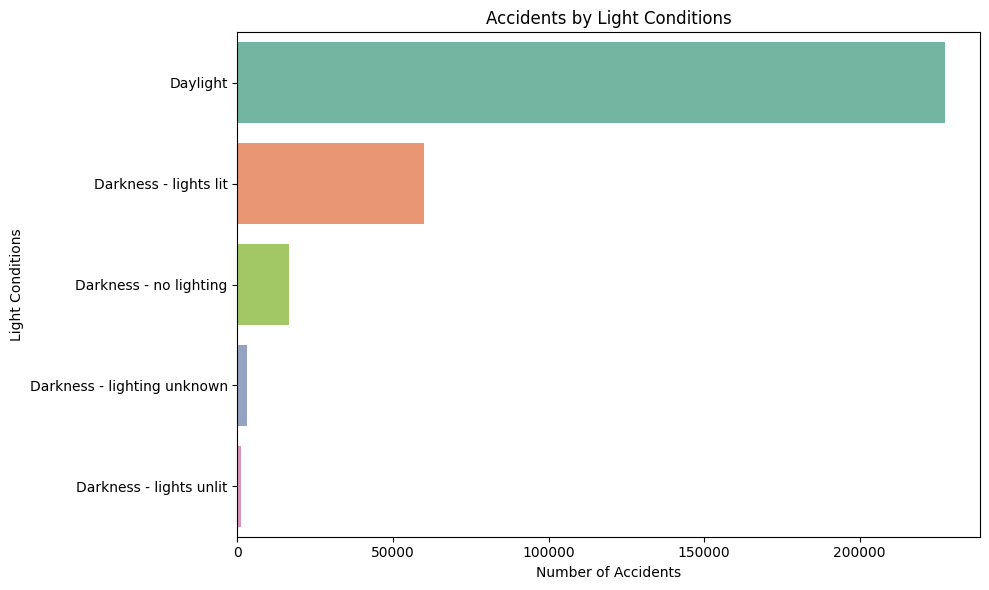

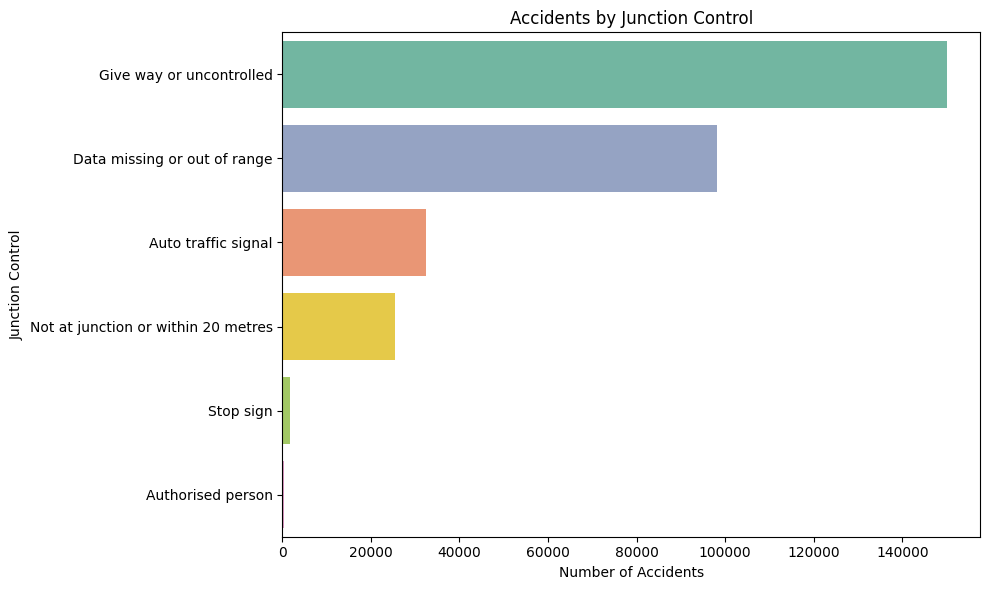

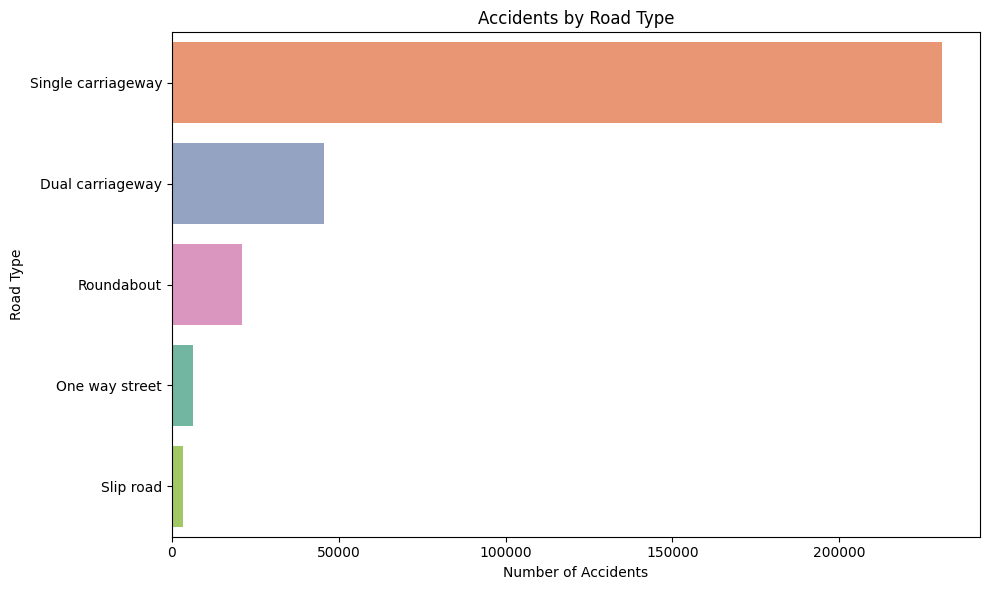

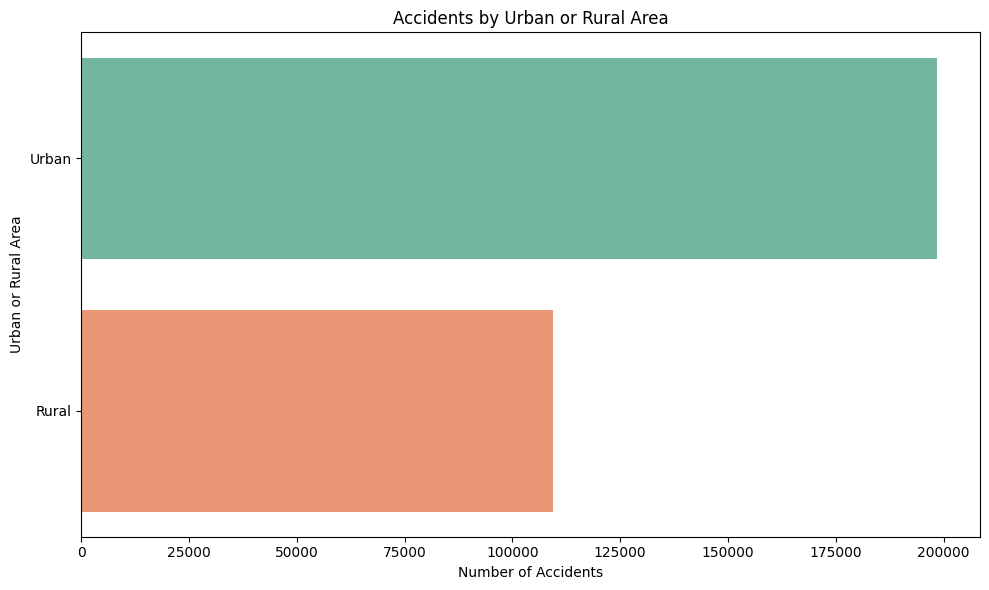

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

df.columns = df.columns.str.strip()

factor_columns = [
    'Weather_Conditions',
    'Road_Surface_Conditions',
    'Light_Conditions',
    'Junction_Control',
    'Road_Type',
    'Urban_or_Rural_Area'
]

for column in factor_columns:
    if column in df.columns:
        plt.figure(figsize=(10, 6))
        sns.countplot(
            data=df,
            y=column,
            order=df[column].value_counts().index,
            hue=column,
            palette='Set2',
            legend=False
        )
        plt.title(f"Accidents by {column.replace('_', ' ')}")
        plt.xlabel("Number of Accidents")
        plt.ylabel(column.replace('_', ' '))
        plt.tight_layout()
        plt.show()
    else:
        print(f"⚠️ Column '{column}' not found in the dataset.")